# Preliminary MITGCM Analysis 

**Purpose**: Code for producing daily sea-state maps from Matt's "long run" model run for the MIT GCM. This is an introduction back into working with python and getting familiar with xarray and xgcm libraries.

**Luke Colosi | lcolosi@ucsd.edu**

Force matplotlib plots to display directly within the output cell of the notebook: 

In [1]:
%matplotlib inline

Import python libraries

In [2]:
import sys
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt 
from xmitgcm import open_mdsdataset
import xgcm 
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import os
import re
from scipy.interpolate import interp1d
from matplotlib.animation import FuncAnimation, FFMpegWriter

#--- Other Functions ---# 
sys.path.append("/home/lcolosi/AirSeaCoupling/tools/")
import cartopy_figs as cart

Set data analysis parameters

In [3]:
# Model parameters 
delta_t = 150  # Time steps of the raw model run (by raw, I mean the time increments that the model is ran at, not time increments that the diagnostics are output at). Units: seconds
T = 15          # Time period to analyze. Units: Days

# Set time and space parameters  
lat_bnds  = [32.5, 35]                                           # Specifies the latitude bounds for the region to analyze
lon_bnds  = [236.0, 241.0]                                       # Specifies the longitude bounds for the region to analyze
time_bnds = ["2016-01-01 0:0:0","2016-01-04 23:59:59"]              # Specifies the year(s) to analyze, example: ["2015-12-27 3:0:0","2015-12-28 3:0:0"]  
encoding  = {'time': {'units': 'seconds since 2015-12-01 2:00'}} # Specifies the start time of the model run

# Set path to project directory
PATH_GRID   = '/data/SO2/SWOT/GRID/BIN/'                    # Space and time grid of the model 
PATH_OUTPUT = '/data/SO2/SWOT/MARA/RUN4_LY/DIAGS_HRLY/'     # Diagnostics of the model
PATH_nc     = '/data/SO3/lcolosi/mitgcm/SWOT_MARA_RUN4_LY'  # Directory to save netCDFs 
PATH_figs   = '/home/lcolosi/AirSeaCoupling/figs_server/mitgcm/preliminary/'
PATH_bathy  = '/data/SO3/lcolosi/bathymetry/'
file_dim    = '3D'                                          # Set the dimension of the data (to include the depth or not)

# Set plotting parameters 
fontsize = 14

Obtain the starting iteration number for the diagnostics

In [4]:
# List all files in the directory
files = sorted(f for f in os.listdir(PATH_OUTPUT) if f.startswith("diags_" + file_dim))

# Set the first and second iteration numbers 
match1 = re.search(r'\.(\d+)\.', files[0])
match2 = re.search(r'\.(\d+)\.', files[2])
iter_num_1 = int(match1.group(1))  
iter_num_2 = int(match2.group(1)) 

# Compute the iteration difference 
iter_step = iter_num_2 - iter_num_1

# Time increment between diagnostic output in units of hours
time_step = delta_t * (1/60) * (1/60) * iter_step
print('Time resolution: ' + str(time_step) + ' hours')

# Set the number of interations you need 
number_int = int((T * 24) / time_step)

# Specify the iterations 
iters = list(np.arange(iter_num_1,iter_num_1 + iter_step*number_int,iter_step))

Time resolution: 1.0 hours


Load the grid and diagnostics data into a python structure. The diagnostics that we will be looking at include: 

1. **Potential Temperature** $\theta$: $^\circ C$
2. **Salinity** $S$: $g/kg$
3. **Stratification** $\frac{d\sigma}{dz}$: $kg/m^4$
4. **Zonal, meridional, and vertical velocity components**  $\textbf{u} = (u,v,w)$: $m/s$   

In [5]:
# Create dataset 
ds = open_mdsdataset(
    PATH_OUTPUT,                    # File path where the model output data is stored (.data and .meta files)
    PATH_GRID,                      # File path to the grid data of the model 
    iters=iters,                    # Specifies which iteration of the data to load
    delta_t=delta_t, 
    ignore_unknown_vars=False,      # Specifies whether to ignore any unknown variables that may appear in the dataset
    prefix=['diags_' + file_dim],   # List of prefixes to filter the variables in the dataset
    ref_date="2015-01-01 02:00:00", # Specifies the starting point of the simulation time (which may include the spin up time before diagnostics are output)
    geometry='sphericalpolar'       # Specifies the  grid's geometry is spherical-polar. 
)

# Convert all variables and coordinates in the dataset to little-endian (the format how multi-byte values are stored into memory)

#--- Variables ---#
for var in ds.data_vars:
    if ds[var].dtype.byteorder == '>' or (ds[var].dtype.byteorder == '=' and sys.byteorder == "big"):  # Check if big-endian
        ds[var] = ds[var].astype(ds[var].dtype.newbyteorder('<'))

#--- Coordinates ---# 
for coord in ds.coords:
    if ds[coord].dtype.byteorder == '>'or (ds[coord].dtype.byteorder == '=' and sys.byteorder == "big"):  # Check if big-endian
        ds[coord] = ds[coord].astype(ds[coord].dtype.newbyteorder('<'))

Read in bathymetry data

In [6]:
# Load bathymetry data 
filename = PATH_bathy + "topo_25.1.nc"
ds_bathy = xr.open_dataset(filename, engine="netcdf4")

# Extract data variables
lon_b = ds_bathy["lon"]  # Longitude
lat_b = ds_bathy["lat"]  # Latitude
bathy = ds_bathy["z"]    # Elevation/Bathymetry

# Convert convesion of longitude (neg from the prime meridian to positive definite wrapping around the earth)
lon_n = lon_b % 360

# Set max and min values 
lon_min = lon_bnds[0]
lon_max = lon_bnds[1]
lat_min = lat_bnds[0]
lat_max = lat_bnds[1]

# Extract data from bathymetry 
lon_grid = lon_n[(lon_n >= lon_min) & (lon_n <= lon_max)]
lat_grid = lat_b[(lat_b >= lat_min) & (lat_b <= lat_max)]
bathy_grid   = bathy[(lat_b >= lat_min) & (lat_b <= lat_max),(lon_n >= lon_min) & (lon_n <= lon_max)]

Slice the array based on latitude and longitude bounds

In [7]:
ds_subset = ds.sel(
    time=slice(*time_bnds),
    XG=slice(*lon_bnds),
    YG=slice(*lat_bnds),
    XC=slice(*lon_bnds),
    YC=slice(*lat_bnds),
).isel(Z=0, Zl=0, Zp1=0, Zu=0)

Get the grid coordinates

In [8]:
# Extract coordinates 
lon = ds_subset['XC'].values
lat = ds_subset['YC'].values
lon_XG = ds_subset['XG'].values
lat_YG = ds_subset['YG'].values
depth = ds_subset['Z'].values
time = ds_subset['time'].values
depth_vec = ds['Z'].values

# Get the grid resolution 
lon_res   = abs(lon[1] - lon[0]) * 111*10**3 * (1/1000)
lat_res   = abs(lat[1] - lat[0]) * 111*10**3 * (1/1000)
depth_res = abs(depth_vec[1] - depth_vec[0]) 

print('Longitude resolution: ' + str(lon_res) + ' kilometers')
print('Latitude resolution: ' + str(lat_res) + ' kilometers')
print('Depth spacing first bin: ' + str(depth_res) + ' meters')

Longitude resolution: 2.3102417 kilometers
Latitude resolution: 2.3089716 kilometers
Depth spacing first bin: 1.07 meters


Grab the first time step, define state variables and compute velocity gradient statistics

In [9]:
# Slice the dataset to grab the first time step 
ds_i = ds_subset.isel(time=0)

# Extract data 
theta_z = np.squeeze(ds_i['THETA'].values)
S_z = np.squeeze(ds_i['SALT'].values)
u_z = np.squeeze(ds_i['UVEL'].values)
v_z = np.squeeze(ds_i['VVEL'].values)
w_z = np.squeeze(ds_i['WVEL'].values)

# Interpolate u_z from YC,XG grid onto the YC,XC grid 
# Interpolate each row along columns (axis=1)
u_int = np.array([
    interp1d(lon_XG, row, kind='linear', bounds_error=False)(lon)
    for row in u_z
])

# Interpolate v_z from YG,XC grid onto the YC,XC grid 
v_int = np.array([
    interp1d(lat_YG, col, kind='linear', bounds_error=False)(lat)
    for col in v_z.T
]).T 

# Compute the horizontal speed 
U = np.sqrt(u_int**2 + v_int**2)

# Compute spatial derivatives at the scale of the grid
dx = abs(lon[1] - lon[0]) * 111*10**3 # Units: meters
dy = abs(lat[1] - lat[0]) * 111*10**3 # Units: meters
dudx = np.gradient(u_int, dx, axis=1) # Units: m/s/m = 1/s
dvdy = np.gradient(v_int, dy, axis=0)
dvdx = np.gradient(v_int, dx, axis=1)
dudy = np.gradient(u_int, dy, axis=0)

# Compute the coriolis parameter (the local vertical planetary vorticity)
omega = 7.2921 * 10**(-5)            # Magnitude of Earth's rotation rate, Units: rad/s 
f = 2*omega*np.sin(np.deg2rad(lat))  # Units: rad/s

# Compute vorticity, divergence, and strain 
vort   = (dvdx - dudy)/ f[:, np.newaxis]
div    = (dudx + dvdy)/f[:, np.newaxis]
strain = (((dudx - dvdy)**2 + (dvdx + dudy)**2)**(1/2))/f[:, np.newaxis]  # Total strain magnitude linear combination of stretching and angular spreading strain

Plot each of the variables to visualize output

/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/tmp/ipykernel_1383330/1712648861.py:180: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


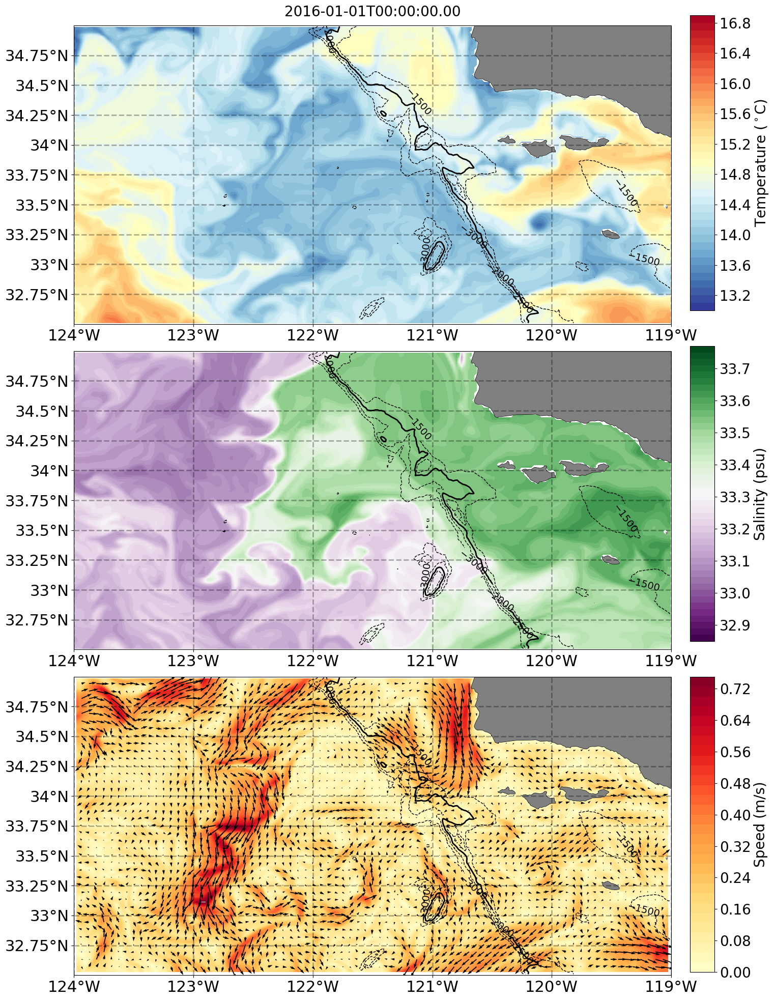

In [10]:
# Set plotting parameters
projection = ccrs.PlateCarree(central_longitude=0.0)
xticks = [-124, -123, -122, -121, -120, -119]
yticks = [32.75, 33.00, 33.25, 33.50, 33.75, 34.00, 34.25, 34.50, 34.75,]
resolution = "10m"
bounds = np.arange(0,360+40,40)
lon_min = -124
lon_max = -119
lat_min = 32.50
lat_max = 35

# Create figure
fig, axes = plt.subplots(3,1, figsize=(24, 20), subplot_kw={"projection": projection})
ax1, ax2, ax3= axes.flatten()

# Set title 
fig.suptitle(str(time[0])[:-7], fontsize=20)

# --- Subplot #1 --- # 
levels = np.arange(13,17,0.1)

# Set figure axes 
cart.set_subplots(ax1, projection, resolution, lon_min=-124, lon_max=-119, lat_min=32.50, lat_max=35) 

# Plot potential temperature
mesh = ax1.contourf(
    lon, lat, theta_z, levels=levels,
    transform=ccrs.PlateCarree(),
    cmap='RdYlBu_r',  
    shading="auto"
)

# Plot depth contour lines
levels_bath = np.arange(-3000,-1000,500)
contour1 = ax1.contour(lon_grid, lat_grid, bathy_grid,levels=levels_bath, colors='black', linewidths=1, linestyles='dashed')
contour2 = ax1.contour(lon_grid, lat_grid, bathy_grid,levels=[-2000], colors='black', linewidths=2, linestyles='solid')
plt.clabel(contour1, fontsize=14)
plt.clabel(contour2, fontsize=14)

# Set grid ticks 
cart.set_grid_ticks(
    ax1,
    projection=ccrs.PlateCarree(),
    xticks=xticks,
    yticks=yticks,
    xlabels=True,
    ylabels=True,
    grid=True,
    fontsize=22,
    color="black",
)

# Create colormap
cax = plt.axes([0.76, 0.68, 0.02, 0.29])
cart.set_cbar(
    mesh,
    cax,
    fig,
    orientation="vertical",
    extend="neither",
    cbar_label=r"Temperature ($^\circ$C)",
    nbins=10,
    fontsize=20,
    cbar_ticks=[],
    task="regular",
)

# --- Subplot #2 --- # 
levels = np.arange(32.85,33.75 + 0.02,0.02)

# Set figure axes 
cart.set_subplots(ax2, projection, resolution, lon_min=-124, lon_max=-119, lat_min=32.50, lat_max=35) 

# Plot potential temperature
mesh = ax2.contourf(
    lon, lat, S_z, levels=levels,
    transform=ccrs.PlateCarree(),
    cmap='PRGn',  
    shading="auto"
)

# Plot depth contour lines
levels_bath = np.arange(-3000,-1000,500)
contour1 = ax2.contour(lon_grid, lat_grid, bathy_grid,levels=levels_bath, colors='black', linewidths=1, linestyles='dashed')
contour2 = ax2.contour(lon_grid, lat_grid, bathy_grid,levels=[-2000], colors='black', linewidths=2, linestyles='solid')
plt.clabel(contour1, fontsize=14)
plt.clabel(contour2, fontsize=14)

# Set grid ticks 
cart.set_grid_ticks(
    ax2,
    projection=ccrs.PlateCarree(),
    xticks=xticks,
    yticks=yticks,
    xlabels=True,
    ylabels=True,
    grid=True,
    fontsize=22,
    color="black",
)

# Create colormap
cax = plt.axes([0.76, 0.355, 0.02, 0.29])
cart.set_cbar(
    mesh,
    cax,
    fig,
    orientation="vertical",
    extend="neither",
    cbar_label=r'Salinity (psu)',
    nbins=10,
    fontsize=20,
    cbar_ticks=[],
    task="regular",
)

# --- Subplot #3 --- # 
levels = np.arange(0,0.75 + 0.025,0.025)

# Set figure axes 
cart.set_subplots(ax3, projection, resolution, lon_min=-124, lon_max=-119, lat_min=32.50, lat_max=35) 

# Plot fluid speed
mesh = ax3.contourf(
    lon, lat, U, levels=levels,
    transform=ccrs.PlateCarree(),
    cmap='YlOrRd',  
    shading="auto"
)

# Subsample the grid by choosing every second point (adjust this as needed)
step = 3  # This controls the density of the quiver arrows
lon_sub = lon[::step]
lat_sub = lat[::step]
u_sub = u_int[::step, ::step]
v_sub = v_int[::step, ::step]

# Plot velocity vectors 
qv = ax3.quiver(lon_sub,lat_sub,u_sub,v_sub,scale=20,color='k',width=0.0015)

# Add a quiver key for reference velocity
ax3.quiverkey(qv, 0.9615, 0.3, 0.5, label=r'$U = 0.5 \;ms^{-1}$', labelpos = 'W', coordinates='figure',fontproperties={'size':15})

# Plot depth contour lines
levels_bath = np.arange(-3000,-1000,500)
contour1 = ax3.contour(lon_grid, lat_grid, bathy_grid,levels=levels_bath, colors='black', linewidths=1, linestyles='dashed')
contour2 = ax3.contour(lon_grid, lat_grid, bathy_grid,levels=[-2000], colors='black', linewidths=2, linestyles='solid')
plt.clabel(contour1, fontsize=14)
plt.clabel(contour2, fontsize=14)

# Set grid ticks 
cart.set_grid_ticks(
    ax3,
    projection=ccrs.PlateCarree(),
    xticks=xticks,
    yticks=yticks,
    xlabels=True,
    ylabels=True,
    grid=True,
    fontsize=22,
    color="black",
)

# Create colormap
cax = plt.axes([0.76, 0.03, 0.02, 0.29])
cart.set_cbar(
    mesh,
    cax,
    fig,
    orientation="vertical",
    extend="neither",
    cbar_label=r'Speed (m/s)',
    nbins=10,
    fontsize=20,
    cbar_ticks=[],
    task="regular",
)

# Show the plot
fig.tight_layout()
plt.subplots_adjust(top=0.96)
plt.show()

# Save figure 
fig.savefig(fname = PATH_figs + 'temp_sal_vel_'  + str(time[0])[0:4] + '_' + str(time[0])[5:7] + '_' + str(time[0])[8:10], bbox_inches = 'tight', dpi=300)

/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/tmp/ipykernel_1383330/3186047211.py:203: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


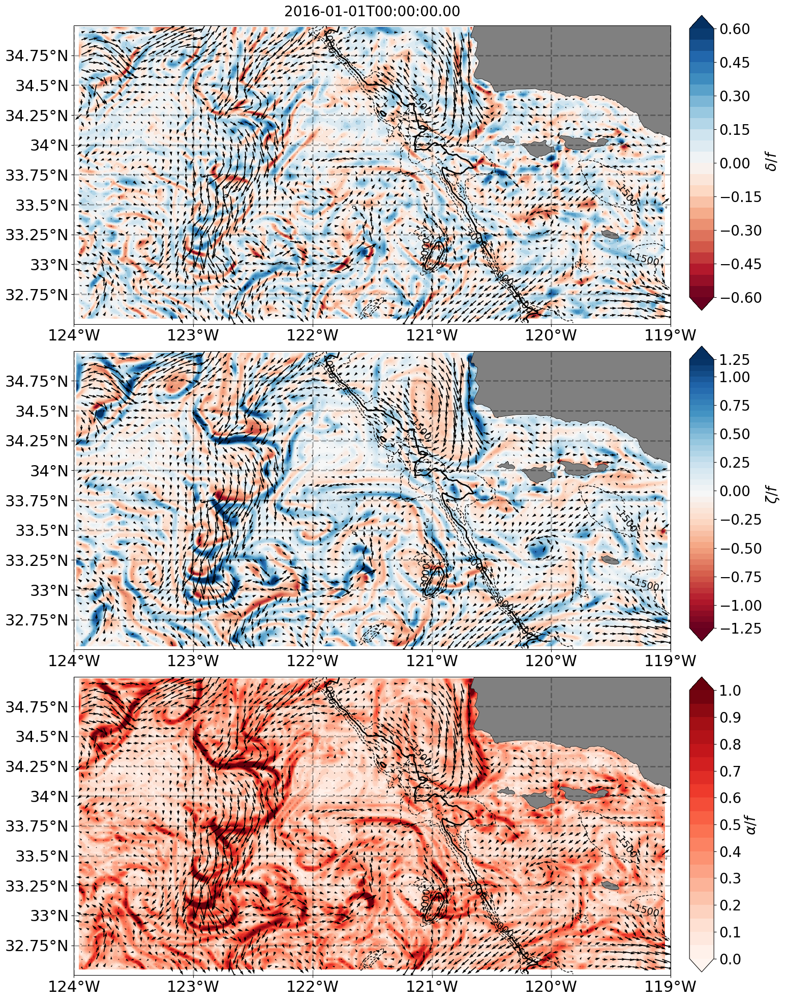

In [11]:
# Set plotting parameters
projection = ccrs.PlateCarree(central_longitude=0.0)
xticks = [-124, -123, -122, -121, -120, -119]
yticks = [32.75, 33.00, 33.25, 33.50, 33.75, 34.00, 34.25, 34.50, 34.75,]
resolution = "10m"
bounds = np.arange(0,360+40,40)
lon_min = -124
lon_max = -119
lat_min = 32.50
lat_max = 35

# Create figure
fig, axes = plt.subplots(3,1, figsize=(24, 20), subplot_kw={"projection": projection})
ax1, ax2, ax3= axes.flatten()

# Set title 
fig.suptitle(str(time[0])[:-7], fontsize=20)

# --- Subplot #1 --- # 
levels = np.arange(-0.6,0.6 + 0.05,0.05)

# Set figure axes 
cart.set_subplots(ax1, projection, resolution, lon_min=-124, lon_max=-119, lat_min=32.50, lat_max=35) 

# Plot divergence
mesh = ax1.contourf(
    lon, lat, div, levels=levels,
    transform=ccrs.PlateCarree(),
    cmap='RdBu',  
    shading="auto", 
    extend='both'
)

# Plot depth contour lines
levels_bath = np.arange(-3000,-1000,500)
contour1 = ax1.contour(lon_grid, lat_grid, bathy_grid,levels=levels_bath, colors='black', linewidths=1, linestyles='dashed')
contour2 = ax1.contour(lon_grid, lat_grid, bathy_grid,levels=[-2000], colors='black', linewidths=2, linestyles='solid')
plt.clabel(contour1, fontsize=14)
plt.clabel(contour2, fontsize=14)

# Subsample the grid by choosing every second point (adjust this as needed)
step = 3  # This controls the density of the quiver arrows
lon_sub = lon[::step]
lat_sub = lat[::step]
u_sub = u_int[::step, ::step]
v_sub = v_int[::step, ::step]

# Plot velocity vectors 
qv = ax1.quiver(lon_sub,lat_sub,u_sub,v_sub,scale=20,color='k',width=0.0015)

# Set grid ticks 
cart.set_grid_ticks(
    ax1,
    projection=ccrs.PlateCarree(),
    xticks=xticks,
    yticks=yticks,
    xlabels=True,
    ylabels=True,
    grid=True,
    fontsize=22,
    color="black",
)

# Create colormap
cax = plt.axes([0.76, 0.68, 0.02, 0.29])
cart.set_cbar(
    mesh,
    cax,
    fig,
    orientation="vertical",
    extend="both",
    cbar_label=r" $\delta/f$",
    nbins=10,
    fontsize=20,
    cbar_ticks=[],
    task="regular",
)

# --- Subplot #2 --- # 
levels = np.arange(-1.2,1.2,0.05)

# Set figure axes 
cart.set_subplots(ax2, projection, resolution, lon_min=-124, lon_max=-119, lat_min=32.50, lat_max=35) 

# Plot vorticity
mesh = ax2.contourf(
    lon, lat, vort, levels=levels,
    transform=ccrs.PlateCarree(),
    cmap='RdBu',  
    shading="auto", 
    extend='both'
)

# Plot depth contour lines
levels_bath = np.arange(-3000,-1000,500)
contour1 = ax2.contour(lon_grid, lat_grid, bathy_grid,levels=levels_bath, colors='black', linewidths=1, linestyles='dashed')
contour2 = ax2.contour(lon_grid, lat_grid, bathy_grid,levels=[-2000], colors='black', linewidths=2, linestyles='solid')
plt.clabel(contour1, fontsize=14)
plt.clabel(contour2, fontsize=14)

# Subsample the grid by choosing every second point (adjust this as needed)
step = 3  # This controls the density of the quiver arrows
lon_sub = lon[::step]
lat_sub = lat[::step]
u_sub = u_int[::step, ::step]
v_sub = v_int[::step, ::step]

# Plot velocity vectors 
qv = ax2.quiver(lon_sub,lat_sub,u_sub,v_sub,scale=20,color='k',width=0.0015)

# Set grid ticks 
cart.set_grid_ticks(
    ax2,
    projection=ccrs.PlateCarree(),
    xticks=xticks,
    yticks=yticks,
    xlabels=True,
    ylabels=True,
    grid=True,
    fontsize=22,
    color="black",
)

# Create colormap
cax = plt.axes([0.76, 0.355, 0.02, 0.29])
cart.set_cbar(
    mesh,
    cax,
    fig,
    orientation="vertical",
    extend="both",
    cbar_label=r'$\zeta/f$',
    nbins=10,
    fontsize=20,
    cbar_ticks=[],
    task="regular",
)

# --- Subplot #3 --- # 
levels = np.arange(0,1 + 0.05,0.05)

# Set figure axes 
cart.set_subplots(ax3, projection, resolution, lon_min=-124, lon_max=-119, lat_min=32.50, lat_max=35) 

# Plot strain magnitude
mesh = ax3.contourf(
    lon, lat, strain, levels=levels,
    transform=ccrs.PlateCarree(),
    cmap='Reds',  
    shading="auto", 
    extend='both'
)

# Plot depth contour lines
levels_bath = np.arange(-3000,-1000,500)
contour1 = ax3.contour(lon_grid, lat_grid, bathy_grid,levels=levels_bath, colors='black', linewidths=1, linestyles='dashed')
contour2 = ax3.contour(lon_grid, lat_grid, bathy_grid,levels=[-2000], colors='black', linewidths=2, linestyles='solid')
plt.clabel(contour1, fontsize=14)
plt.clabel(contour2, fontsize=14)

# Subsample the grid by choosing every second point (adjust this as needed)
step = 3  # This controls the density of the quiver arrows
lon_sub = lon[::step]
lat_sub = lat[::step]
u_sub = u_int[::step, ::step]
v_sub = v_int[::step, ::step]

# Plot velocity vectors 
qv = ax3.quiver(lon_sub,lat_sub,u_sub,v_sub,scale=20,color='k',width=0.0015)

# Add a quiver key for reference velocity
ax3.quiverkey(qv, 0.9615, 0.3, 0.5, label=r'$U = 0.5 \;ms^{-1}$', labelpos = 'W', coordinates='figure',fontproperties={'size':15})

# Set grid ticks 
cart.set_grid_ticks(
    ax3,
    projection=ccrs.PlateCarree(),
    xticks=xticks,
    yticks=yticks,
    xlabels=True,
    ylabels=True,
    grid=True,
    fontsize=22,
    color="black",
)

# Create colormap
cax = plt.axes([0.76, 0.03, 0.02, 0.29])
cart.set_cbar(
    mesh,
    cax,
    fig,
    orientation="vertical",
    extend="both",
    cbar_label=r'$\alpha/f$',
    nbins=10,
    fontsize=20,
    cbar_ticks=[],
    task="regular",
)

# Show the plot
fig.tight_layout()
plt.subplots_adjust(top=0.96)
plt.show()

# Save figure 
fig.savefig(fname = PATH_figs + 'vel_gradients_'  + str(time[0])[0:4] + '_' + str(time[0])[5:7] + '_' + str(time[0])[8:10], bbox_inches = 'tight', dpi=300)

Create an animation of the temperature, salinity, and velocity fields

/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by

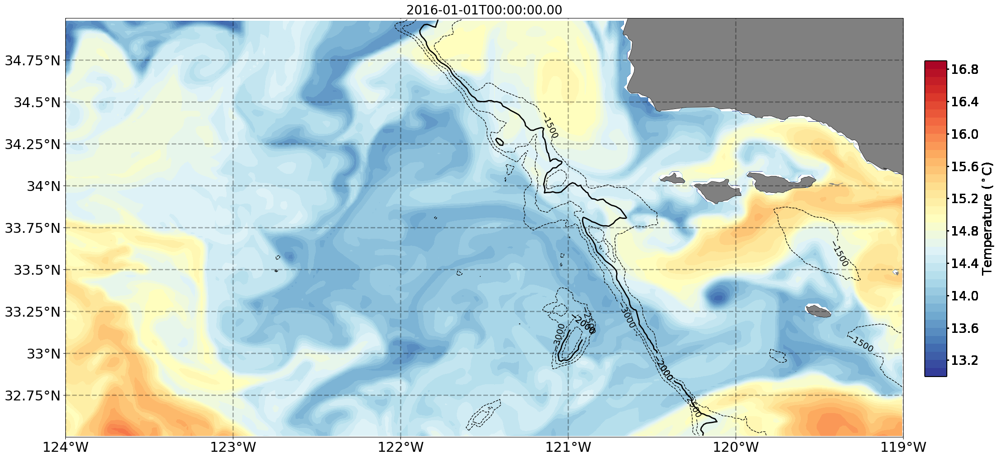

In [12]:
# Set plotting parameters
projection = ccrs.PlateCarree(central_longitude=0.0)
xticks = [-124, -123, -122, -121, -120, -119]
yticks = [32.75, 33.00, 33.25, 33.50, 33.75, 34.00, 34.25, 34.50, 34.75,]
resolution = "10m"
cmap = plt.get_cmap('RdYlBu_r') 
bounds = np.arange(0,360+40,40)
lon_min = -124
lon_max = -119
lat_min = 32.50
lat_max = 35
levels = np.arange(13,17,0.1)
num_frames = len(ds_subset['time'])

# Create figure
fig, ax = plt.subplots(1,1, figsize=(24, 20), subplot_kw={"projection": projection})

# Set figure axes 
cart.set_subplots(ax, projection, resolution, lon_min=-124, lon_max=-119, lat_min=32.50, lat_max=35)

# ---------------------
# Animation update function
# ---------------------
def update(frame, ds_subset, time, cmap, projection, resolution, levels, xticks, yticks, fig):

    # Clear the axis to reset the plot
    ax.clear()

    # Redraw map features
    cart.set_subplots(ax, projection, resolution, lon_min=-124, lon_max=-119, lat_min=32.50, lat_max=35)

    # Add a dynamic title 
    ax.set_title(str(time[frame])[:-7],fontsize=20) # ax.set_title(f"Time Step: {time_step * frame} hours") 

    # Plot potential temperature
    mesh = ax.contourf(
        lon, lat, ds_subset['THETA'][frame,:,:], levels=levels,
        transform=ccrs.PlateCarree(),
        cmap=cmap,  
        shading="auto"
    )

    # Plot depth contour lines
    levels_bath = np.arange(-3000,-1000,500)
    contour1 = ax.contour(lon_grid, lat_grid, bathy_grid,levels=levels_bath, colors='black', linewidths=1, linestyles='dashed')
    contour2 = ax.contour(lon_grid, lat_grid, bathy_grid,levels=[-2000], colors='black', linewidths=2, linestyles='solid')
    plt.clabel(contour1, fontsize=14)
    plt.clabel(contour2, fontsize=14)

    # Set grid ticks 
    cart.set_grid_ticks(
        ax,
        projection=ccrs.PlateCarree(),
        xticks=xticks,
        yticks=yticks,
        xlabels=True,
        ylabels=True,
        grid=True,
        fontsize=22,
        color="black",
    )

    # Create colormap
    cax = plt.axes([0.92, 0.33, 0.02, 0.35])
    cart.set_cbar(
        mesh,
        cax,
        fig,
        orientation="vertical",
        extend="neither",
        cbar_label=r"Temperature ($^\circ$C)",
        nbins=10,
        fontsize=20,
        cbar_ticks=[],
        task="regular",
    )

    return []

# ---------------------
# Create animation
# ---------------------
ani = FuncAnimation(fig, update, frames=num_frames, fargs=(ds_subset, time, cmap, projection, resolution, levels, xticks, yticks,fig), blit=False)

# ---------------------
# Save animation
# ---------------------
writer = FFMpegWriter(fps=10, metadata={'artist': 'Temperature time evolution map'})
ani.save(PATH_figs + 'temp_evolution_st_time_' + str(time[0])[0:4] + '_' + str(time[0])[5:7] + '_' + str(time[0])[8:10] + '.mp4', writer=writer)

/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by

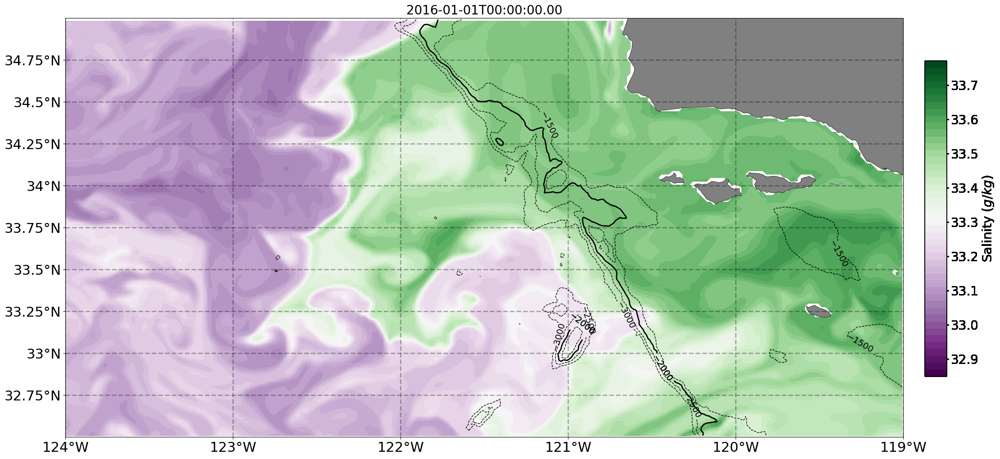

In [13]:
# Set plotting parameters
projection = ccrs.PlateCarree(central_longitude=0.0)
xticks = [-124, -123, -122, -121, -120, -119]
yticks = [32.75, 33.00, 33.25, 33.50, 33.75, 34.00, 34.25, 34.50, 34.75,]
resolution = "10m"
cmap = plt.get_cmap('PRGn')
bounds = np.arange(0,360+40,40)
lon_min = -124
lon_max = -119
lat_min = 32.50
lat_max = 35
levels = np.arange(32.85,33.75 + 0.02,0.02)
num_frames = len(ds_subset['time'])

# Create figure
fig, ax = plt.subplots(1,1, figsize=(24, 20), subplot_kw={"projection": projection})

# Set figure axes 
cart.set_subplots(ax, projection, resolution, lon_min=-124, lon_max=-119, lat_min=32.50, lat_max=35)

# ---------------------
# Animation update function
# ---------------------
def update(frame, ds_subset, time, cmap, projection, resolution, levels, xticks, yticks, fig):

    # Clear the axis to reset the plot
    ax.clear()

    # Redraw map features
    cart.set_subplots(ax, projection, resolution, lon_min=-124, lon_max=-119, lat_min=32.50, lat_max=35)

    # Add a dynamic title 
    ax.set_title(str(time[frame])[:-7],fontsize=20) # ax.set_title(f"Time Step: {time_step * frame} hours") 

    # Plot potential temperature
    mesh = ax.contourf(
        lon, lat, ds_subset['SALT'][frame,:,:], levels=levels,
        transform=ccrs.PlateCarree(),
        cmap=cmap,  
        shading="auto"
    )

    # Plot depth contour lines
    levels_bath = np.arange(-3000,-1000,500)
    contour1 = ax.contour(lon_grid, lat_grid, bathy_grid,levels=levels_bath, colors='black', linewidths=1, linestyles='dashed')
    contour2 = ax.contour(lon_grid, lat_grid, bathy_grid,levels=[-2000], colors='black', linewidths=2, linestyles='solid')
    plt.clabel(contour1, fontsize=14)
    plt.clabel(contour2, fontsize=14)

    # Set grid ticks 
    cart.set_grid_ticks(
        ax,
        projection=ccrs.PlateCarree(),
        xticks=xticks,
        yticks=yticks,
        xlabels=True,
        ylabels=True,
        grid=True,
        fontsize=22,
        color="black",
    )

    # Create colormap
    cax = plt.axes([0.92, 0.33, 0.02, 0.35])
    cart.set_cbar(
        mesh,
        cax,
        fig,
        orientation="vertical",
        extend="neither",
        cbar_label=r"Salinity ($g/kg$)",
        nbins=10,
        fontsize=20,
        cbar_ticks=[],
        task="regular",
    )

    return []

# ---------------------
# Create animation
# ---------------------
ani = FuncAnimation(fig, update, frames=num_frames, fargs=(ds_subset, time, cmap, projection, resolution, levels, xticks, yticks,fig), blit=False)

# ---------------------
# Save animation
# ---------------------
writer = FFMpegWriter(fps=10, metadata={'artist': 'Salinity time evolution map'})
ani.save(PATH_figs + 'sal_evolution_st_time_' + str(time[0])[0:4] + '_' + str(time[0])[5:7] + '_' + str(time[0])[8:10] + '.mp4', writer=writer)

/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by

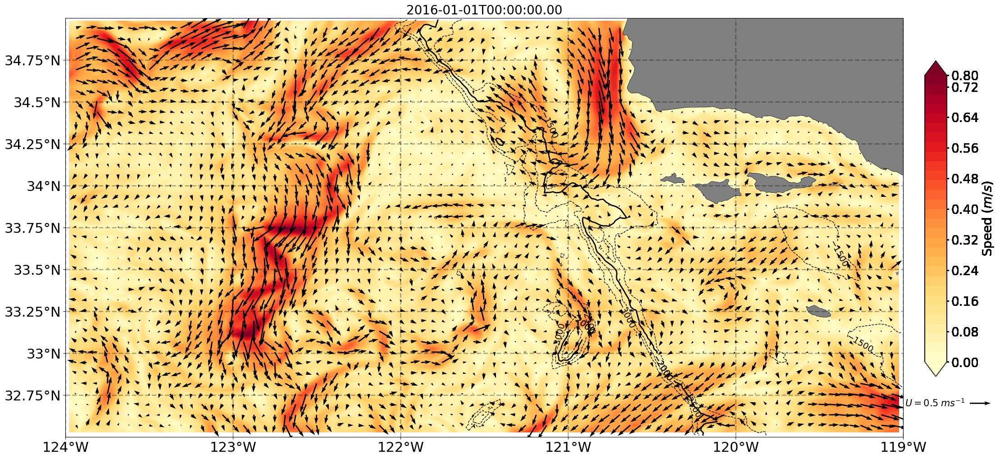

In [14]:
# Set plotting parameters
projection = ccrs.PlateCarree(central_longitude=0.0)
xticks = [-124, -123, -122, -121, -120, -119]
yticks = [32.75, 33.00, 33.25, 33.50, 33.75, 34.00, 34.25, 34.50, 34.75,]
resolution = "10m"
cmap = plt.get_cmap('YlOrRd')
bounds = np.arange(0,360+40,40)
lon_min = -124
lon_max = -119
lat_min = 32.50
lat_max = 35
levels = np.arange(0,0.75 + 0.025,0.025)
num_frames = len(ds_subset['time'])

# Create figure
fig, ax = plt.subplots(1,1, figsize=(24, 20), subplot_kw={"projection": projection})

# Set figure axes 
cart.set_subplots(ax, projection, resolution, lon_min=-124, lon_max=-119, lat_min=32.50, lat_max=35)

# ---------------------
# Animation update function
# ---------------------
def update(frame, ds_subset, lon_XG, lon, lat_YG, lat, time, cmap, projection, resolution, levels, xticks, yticks, fig):

    # Slice the dataset to grab the first time step 
    ds_i = ds_subset.isel(time=frame)

    # Extract data 
    u_z = np.squeeze(ds_i['UVEL'].values)
    v_z = np.squeeze(ds_i['VVEL'].values)

    # Interpolate u_z from YC,XG grid onto the YC,XC grid 
    # Interpolate each row along columns (axis=1)
    u_int = np.array([
        interp1d(lon_XG, row, kind='linear', bounds_error=False)(lon)
        for row in u_z
    ])

    # Interpolate v_z from YG,XC grid onto the YC,XC grid 
    v_int = np.array([
        interp1d(lat_YG, col, kind='linear', bounds_error=False)(lat)
        for col in v_z.T
    ]).T 

    # Compute the horizontal speed 
    U = np.sqrt(u_int**2 + v_int**2)

    # Clear the axis to reset the plot
    ax.clear()

    # Redraw map features
    cart.set_subplots(ax, projection, resolution, lon_min=-124, lon_max=-119, lat_min=32.50, lat_max=35)

    # Add a dynamic title 
    ax.set_title(str(time[frame])[:-7],fontsize=20) # ax.set_title(f"Time Step: {time_step * frame} hours") 

    # Plot fluid speed
    mesh = ax.contourf(
        lon, lat, U, levels=levels,
        transform=ccrs.PlateCarree(),
        cmap=cmap,  
        shading="auto", 
        extend='both'
    )

    # Plot depth contour lines
    levels_bath = np.arange(-3000,-1000,500)
    contour1 = ax.contour(lon_grid, lat_grid, bathy_grid,levels=levels_bath, colors='black', linewidths=1, linestyles='dashed')
    contour2 = ax.contour(lon_grid, lat_grid, bathy_grid,levels=[-2000], colors='black', linewidths=2, linestyles='solid')
    plt.clabel(contour1, fontsize=14)
    plt.clabel(contour2, fontsize=14)

    # Subsample the grid by choosing every second point (adjust this as needed)
    step = 3  # This controls the density of the quiver arrows
    lon_sub = lon[::step]
    lat_sub = lat[::step]
    u_sub = u_int[::step, ::step]
    v_sub = v_int[::step, ::step]

    # Plot velocity vectors 
    qv = ax.quiver(lon_sub,lat_sub,u_sub,v_sub,scale=20,color='k',width=0.0015)

    # Add a quiver key for reference velocity
    ax.quiverkey(qv, 0.9615, 0.3, 0.5, label=r'$U = 0.5 \;ms^{-1}$', labelpos = 'W', coordinates='figure',fontproperties={'size':15})

    # Set grid ticks 
    cart.set_grid_ticks(
        ax,
        projection=ccrs.PlateCarree(),
        xticks=xticks,
        yticks=yticks,
        xlabels=True,
        ylabels=True,
        grid=True,
        fontsize=22,
        color="black",
    )

    # Create colormap
    cax = plt.axes([0.92, 0.33, 0.02, 0.35])
    cart.set_cbar(
        mesh,
        cax,
        fig,
        orientation="vertical",
        extend="neither",
        cbar_label=r"Speed ($m/s$)",
        nbins=10,
        fontsize=20,
        cbar_ticks=[],
        task="regular",
    )

    return []

# ---------------------
# Create animation
# ---------------------
ani = FuncAnimation(fig, update, frames=num_frames, fargs=(ds_subset, lon_XG, lon, lat_YG, lat, time, cmap, projection, resolution, levels, xticks, yticks,fig), blit=False)

# ---------------------
# Save animation
# ---------------------
writer = FFMpegWriter(fps=10, metadata={'artist': 'Velocity time evolution map'})
ani.save(PATH_figs + 'vel_evolution_st_time_' + str(time[0])[0:4] + '_' + str(time[0])[5:7] + '_' + str(time[0])[8:10] + '.mp4', writer=writer)

/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by

/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by

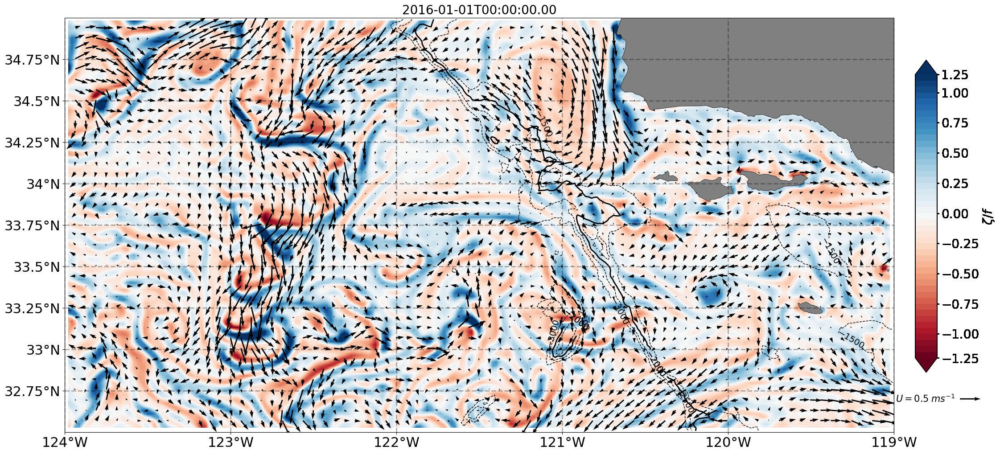

In [15]:
# Set plotting parameters
projection = ccrs.PlateCarree(central_longitude=0.0)
xticks = [-124, -123, -122, -121, -120, -119]
yticks = [32.75, 33.00, 33.25, 33.50, 33.75, 34.00, 34.25, 34.50, 34.75,]
resolution = "10m"
cmap = plt.get_cmap('RdBu')
bounds = np.arange(0,360+40,40)
lon_min = -124
lon_max = -119
lat_min = 32.50
lat_max = 35
levels = np.arange(-1.2,1.2,0.05)
num_frames = len(ds_subset['time'])

# Create figure
fig, ax = plt.subplots(1,1, figsize=(24, 20), subplot_kw={"projection": projection})

# Set figure axes 
cart.set_subplots(ax, projection, resolution, lon_min=-124, lon_max=-119, lat_min=32.50, lat_max=35)

# ---------------------
# Animation update function
# ---------------------
def update(frame, ds_subset, lon_XG, lon, lat_YG, lat, time, cmap, projection, resolution, levels, xticks, yticks, fig):

    # Slice the dataset to grab the first time step 
    ds_i = ds_subset.isel(time=frame)

    # Extract data 
    u_z = np.squeeze(ds_i['UVEL'].values)
    v_z = np.squeeze(ds_i['VVEL'].values)

    # Interpolate u_z from YC,XG grid onto the YC,XC grid 
    # Interpolate each row along columns (axis=1)
    u_int = np.array([
        interp1d(lon_XG, row, kind='linear', bounds_error=False)(lon)
        for row in u_z
    ])

    # Interpolate v_z from YG,XC grid onto the YC,XC grid 
    v_int = np.array([
        interp1d(lat_YG, col, kind='linear', bounds_error=False)(lat)
        for col in v_z.T
    ]).T 

    # Compute the horizontal speed 
    U = np.sqrt(u_int**2 + v_int**2)

    # Compute spatial derivatives at the scale of the grid
    dx = abs(lon[1] - lon[0]) * 111*10**3 # Units: meters
    dy = abs(lat[1] - lat[0]) * 111*10**3 # Units: meters
    dudx = np.gradient(u_int, dx, axis=1) # Units: m/s/m = 1/s
    dvdy = np.gradient(v_int, dy, axis=0)
    dvdx = np.gradient(v_int, dx, axis=1)
    dudy = np.gradient(u_int, dy, axis=0)

    # Compute the coriolis parameter (the local vertical planetary vorticity)
    omega = 7.2921 * 10**(-5)            # Magnitude of Earth's rotation rate, Units: rad/s 
    f = 2*omega*np.sin(np.deg2rad(lat))  # Units: rad/s

    # Compute vorticity, divergence, and strain 
    vort   = (dvdx - dudy)/ f[:, np.newaxis]
    div    = (dudx + dvdy)/f[:, np.newaxis]
    strain = (((dudx - dvdy)**2 + (dvdx + dudy)**2)**(1/2))/f[:, np.newaxis] 

    # Clear the axis to reset the plot
    ax.clear()

    # Redraw map features
    cart.set_subplots(ax, projection, resolution, lon_min=-124, lon_max=-119, lat_min=32.50, lat_max=35)

    # Add a dynamic title 
    ax.set_title(str(time[frame])[:-7],fontsize=20) # ax.set_title(f"Time Step: {time_step * frame} hours") 

    # Plot fluid vorticity
    mesh = ax.contourf(
        lon, lat, vort, levels=levels,
        transform=ccrs.PlateCarree(),
        cmap=cmap,  
        shading="auto",
        extend='both'
    )

    # Plot depth contour lines
    levels_bath = np.arange(-3000,-1000,500)
    contour1 = ax.contour(lon_grid, lat_grid, bathy_grid,levels=levels_bath, colors='black', linewidths=1, linestyles='dashed')
    contour2 = ax.contour(lon_grid, lat_grid, bathy_grid,levels=[-2000], colors='black', linewidths=2, linestyles='solid')
    plt.clabel(contour1, fontsize=14)
    plt.clabel(contour2, fontsize=14)

    # Subsample the grid by choosing every second point (adjust this as needed)
    step = 3  # This controls the density of the quiver arrows
    lon_sub = lon[::step]
    lat_sub = lat[::step]
    u_sub = u_int[::step, ::step]
    v_sub = v_int[::step, ::step]

    # Plot velocity vectors 
    qv = ax.quiver(lon_sub,lat_sub,u_sub,v_sub,scale=20,color='k',width=0.0015)

    # Add a quiver key for reference velocity
    ax.quiverkey(qv, 0.9615, 0.3, 0.5, label=r'$U = 0.5 \;ms^{-1}$', labelpos = 'W', coordinates='figure',fontproperties={'size':15})

    # Set grid ticks 
    cart.set_grid_ticks(
        ax,
        projection=ccrs.PlateCarree(),
        xticks=xticks,
        yticks=yticks,
        xlabels=True,
        ylabels=True,
        grid=True,
        fontsize=22,
        color="black",
    )

    # Create colormap
    cax = plt.axes([0.92, 0.33, 0.02, 0.35])
    cart.set_cbar(
        mesh,
        cax,
        fig,
        orientation="vertical",
        extend="neither",
        cbar_label=r"$\zeta/f$",
        nbins=10,
        fontsize=20,
        cbar_ticks=[],
        task="regular",
    )

    return []

# ---------------------
# Create animation
# ---------------------
ani = FuncAnimation(fig, update, frames=num_frames, fargs=(ds_subset, lon_XG, lon, lat_YG, lat, time, cmap, projection, resolution, levels, xticks, yticks,fig), blit=False)

# ---------------------
# Save animation
# ---------------------
writer = FFMpegWriter(fps=10, metadata={'artist': 'Vorticity time evolution map'})
ani.save(PATH_figs + 'vorticity_evolution_st_time_' + str(time[0])[0:4] + '_' + str(time[0])[5:7] + '_' + str(time[0])[8:10] + '.mp4', writer=writer)

/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by

/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by

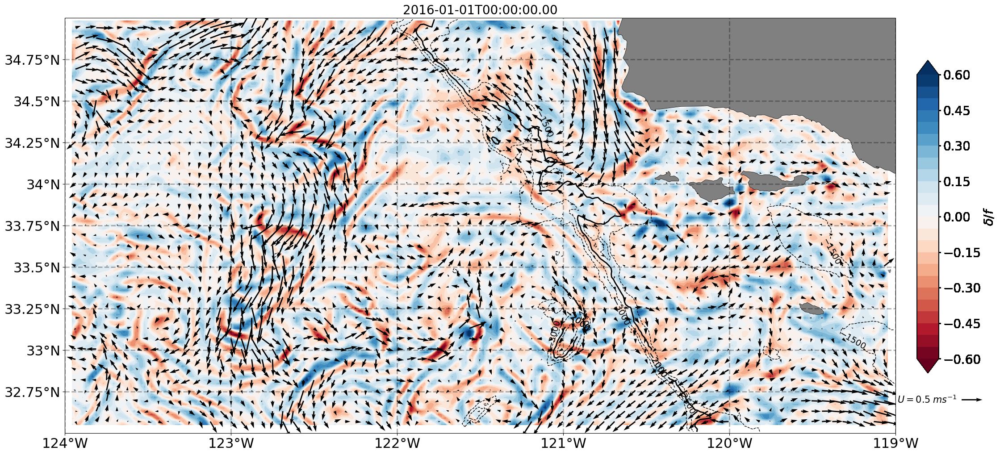

In [16]:
# Set plotting parameters
projection = ccrs.PlateCarree(central_longitude=0.0)
xticks = [-124, -123, -122, -121, -120, -119]
yticks = [32.75, 33.00, 33.25, 33.50, 33.75, 34.00, 34.25, 34.50, 34.75,]
resolution = "10m"
cmap = plt.get_cmap('RdBu')
bounds = np.arange(0,360+40,40)
lon_min = -124
lon_max = -119
lat_min = 32.50
lat_max = 35
levels = np.arange(-0.6,0.6 + 0.05,0.05)
num_frames = len(ds_subset['time'])

# Create figure
fig, ax = plt.subplots(1,1, figsize=(24, 20), subplot_kw={"projection": projection})

# Set figure axes 
cart.set_subplots(ax, projection, resolution, lon_min=-124, lon_max=-119, lat_min=32.50, lat_max=35)

# ---------------------
# Animation update function
# ---------------------
def update(frame, ds_subset, lon_XG, lon, lat_YG, lat, time, cmap, projection, resolution, levels, xticks, yticks, fig):

    # Slice the dataset to grab the first time step 
    ds_i = ds_subset.isel(time=frame)

    # Extract data 
    u_z = np.squeeze(ds_i['UVEL'].values)
    v_z = np.squeeze(ds_i['VVEL'].values)

    # Interpolate u_z from YC,XG grid onto the YC,XC grid 
    # Interpolate each row along columns (axis=1)
    u_int = np.array([
        interp1d(lon_XG, row, kind='linear', bounds_error=False)(lon)
        for row in u_z
    ])

    # Interpolate v_z from YG,XC grid onto the YC,XC grid 
    v_int = np.array([
        interp1d(lat_YG, col, kind='linear', bounds_error=False)(lat)
        for col in v_z.T
    ]).T 

    # Compute the horizontal speed 
    U = np.sqrt(u_int**2 + v_int**2)

    # Compute spatial derivatives at the scale of the grid
    dx = abs(lon[1] - lon[0]) * 111*10**3 # Units: meters
    dy = abs(lat[1] - lat[0]) * 111*10**3 # Units: meters
    dudx = np.gradient(u_int, dx, axis=1) # Units: m/s/m = 1/s
    dvdy = np.gradient(v_int, dy, axis=0)
    dvdx = np.gradient(v_int, dx, axis=1)
    dudy = np.gradient(u_int, dy, axis=0)

    # Compute the coriolis parameter (the local vertical planetary vorticity)
    omega = 7.2921 * 10**(-5)            # Magnitude of Earth's rotation rate, Units: rad/s 
    f = 2*omega*np.sin(np.deg2rad(lat))  # Units: rad/s

    # Compute vorticity, divergence, and strain 
    vort   = (dvdx - dudy)/ f[:, np.newaxis]
    div    = (dudx + dvdy)/f[:, np.newaxis]
    strain = (((dudx - dvdy)**2 + (dvdx + dudy)**2)**(1/2))/f[:, np.newaxis] 

    # Clear the axis to reset the plot
    ax.clear()

    # Redraw map features
    cart.set_subplots(ax, projection, resolution, lon_min=-124, lon_max=-119, lat_min=32.50, lat_max=35)

    # Add a dynamic title 
    ax.set_title(str(time[frame])[:-7],fontsize=20) # ax.set_title(f"Time Step: {time_step * frame} hours") 

    # Plot fluid vorticity
    mesh = ax.contourf(
        lon, lat, div, levels=levels,
        transform=ccrs.PlateCarree(),
        cmap=cmap,  
        shading="auto",
        extend='both'
    )

    # Plot depth contour lines
    levels_bath = np.arange(-3000,-1000,500)
    contour1 = ax.contour(lon_grid, lat_grid, bathy_grid,levels=levels_bath, colors='black', linewidths=1, linestyles='dashed')
    contour2 = ax.contour(lon_grid, lat_grid, bathy_grid,levels=[-2000], colors='black', linewidths=2, linestyles='solid')
    plt.clabel(contour1, fontsize=14)
    plt.clabel(contour2, fontsize=14)

    # Subsample the grid by choosing every second point (adjust this as needed)
    step = 3  # This controls the density of the quiver arrows
    lon_sub = lon[::step]
    lat_sub = lat[::step]
    u_sub = u_int[::step, ::step]
    v_sub = v_int[::step, ::step]

    # Plot velocity vectors 
    qv = ax.quiver(lon_sub,lat_sub,u_sub,v_sub,scale=20,color='k',width=0.0015)

    # Add a quiver key for reference velocity
    ax.quiverkey(qv, 0.9615, 0.3, 0.5, label=r'$U = 0.5 \;ms^{-1}$', labelpos = 'W', coordinates='figure',fontproperties={'size':15})

    # Set grid ticks 
    cart.set_grid_ticks(
        ax,
        projection=ccrs.PlateCarree(),
        xticks=xticks,
        yticks=yticks,
        xlabels=True,
        ylabels=True,
        grid=True,
        fontsize=22,
        color="black",
    )

    # Create colormap
    cax = plt.axes([0.92, 0.33, 0.02, 0.35])
    cart.set_cbar(
        mesh,
        cax,
        fig,
        orientation="vertical",
        extend="neither",
        cbar_label=r"$\delta/f$",
        nbins=10,
        fontsize=20,
        cbar_ticks=[],
        task="regular",
    )

    return []

# ---------------------
# Create animation
# ---------------------
ani = FuncAnimation(fig, update, frames=num_frames, fargs=(ds_subset, lon_XG, lon, lat_YG, lat, time, cmap, projection, resolution, levels, xticks, yticks,fig), blit=False)

# ---------------------
# Save animation
# ---------------------
writer = FFMpegWriter(fps=10, metadata={'artist': 'Divergence time evolution map'})
ani.save(PATH_figs + 'divergence_evolution_st_time_' + str(time[0])[0:4] + '_' + str(time[0])[5:7] + '_' + str(time[0])[8:10] + '.mp4', writer=writer)

Now, let's load the sea surface height data. Let's begin with setting the iterations. 

In [17]:
# Reset the file dimension 
file_dim = '2D'

# List all files in the directory
files = sorted(f for f in os.listdir(PATH_OUTPUT) if f.startswith("diags_" + file_dim))

# Set the first and second iteration numbers 
match1 = re.search(r'\.(\d+)\.', files[0])
match2 = re.search(r'\.(\d+)\.', files[2])
iter_num_1 = int(match1.group(1))  
iter_num_2 = int(match2.group(1)) 

# Compute the iteration difference 
iter_step = iter_num_2 - iter_num_1

# Time increment between diagnostic output in units of hours
time_step = delta_t * (1/60) * (1/60) * iter_step
print('Time resolution: ' + str(time_step) + ' hours')

# Set the number of interations you need 
number_int = int((T * 24) / time_step)

# Specify the iterations 
iters = list(np.arange(iter_num_1,iter_num_1 + iter_step*number_int,iter_step))

Time resolution: 1.0 hours


Load the grid and diagnostics data into a python structure.

In [18]:
# Create dataset 
ds = open_mdsdataset(
    PATH_OUTPUT,                    # File path where the model output data is stored (.data and .meta files)
    PATH_GRID,                      # File path to the grid data of the model 
    iters=iters,                    # Specifies which iteration of the data to load
    delta_t=delta_t, 
    ignore_unknown_vars=False,      # Specifies whether to ignore any unknown variables that may appear in the dataset
    prefix=['diags_' + file_dim],   # List of prefixes to filter the variables in the dataset
    ref_date="2015-01-01 02:00:00", # Specifies the starting point of the simulation time (which may include the spin up time before diagnostics are output)
    geometry='sphericalpolar'       # Specifies the  grid's geometry is spherical-polar. 
)

# Convert all variables and coordinates in the dataset to little-endian (the format how multi-byte values are stored into memory)

#--- Variables ---#
for var in ds.data_vars:
    if ds[var].dtype.byteorder == '>' or (ds[var].dtype.byteorder == '=' and sys.byteorder == "big"):  # Check if big-endian
        ds[var] = ds[var].astype(ds[var].dtype.newbyteorder('<'))

#--- Coordinates ---# 
for coord in ds.coords:
    if ds[coord].dtype.byteorder == '>'or (ds[coord].dtype.byteorder == '=' and sys.byteorder == "big"):  # Check if big-endian
        ds[coord] = ds[coord].astype(ds[coord].dtype.newbyteorder('<'))

Slice the array based on latitude and longitude bounds

In [19]:
ds_subset = ds.sel(
    time=slice(*time_bnds),
    XG=slice(*lon_bnds),
    YG=slice(*lat_bnds),
    XC=slice(*lon_bnds),
    YC=slice(*lat_bnds),
).isel(Z=0, Zl=0, Zp1=0, Zu=0)

Get the grid coordinates

In [20]:
# Extract coordinates 
lon = ds_subset['XC'].values
lat = ds_subset['YC'].values
time = ds_subset['time'].values

# Get the grid resolution 
lon_res   = abs(lon[1] - lon[0]) * 111*10**3 * (1/1000)
lat_res   = abs(lat[1] - lat[0]) * 111*10**3 * (1/1000)

print('Longitude resolution: ' + str(lon_res) + ' kilometers')
print('Latitude resolution: ' + str(lat_res) + ' kilometers')

Longitude resolution: 2.3102417 kilometers
Latitude resolution: 2.3089716 kilometers


Grab the first time step, define state variables and compute velocity gradient statistics

In [21]:
# Slice the dataset to grab the first time step 
ds_i = ds_subset.isel(time=0)

# Extract data 
ssh = np.squeeze(ds_i['ETAN'].values)

Plot each of the variables to visualize output

/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/tmp/ipykernel_1383330/2899458051.py:67: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


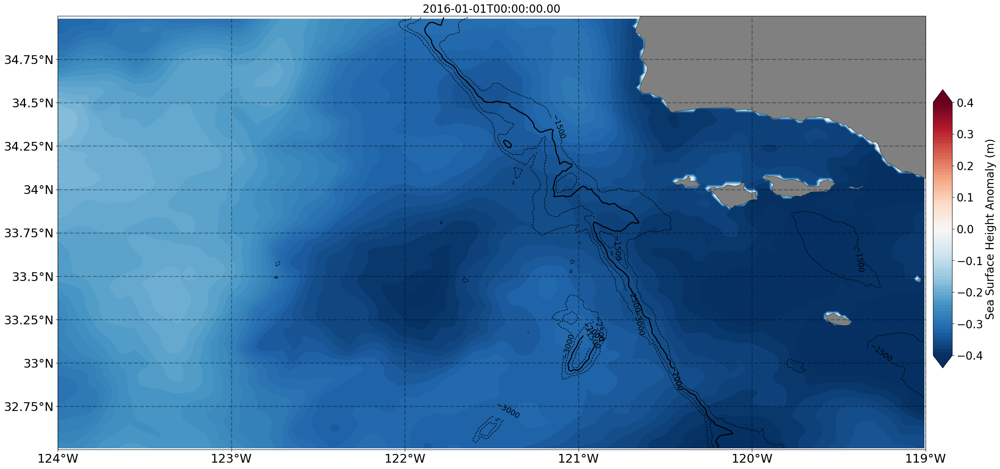

In [22]:
# Set plotting parameters
projection = ccrs.PlateCarree(central_longitude=0.0)
xticks = [-124, -123, -122, -121, -120, -119]
yticks = [32.75, 33.00, 33.25, 33.50, 33.75, 34.00, 34.25, 34.50, 34.75,]
resolution = "10m"
bounds = np.arange(0,360+40,40)
lon_min = -124
lon_max = -119
lat_min = 32.50
lat_max = 35
levels = np.arange(-0.4,0.4+0.01,0.01) #np.arange(-0.4,0.05+0.01,0.01)

# Create figure
fig, axes = plt.subplots(1,1, figsize=(24, 20), subplot_kw={"projection": projection})

# Set title 
axes.set_title(str(time[0])[:-7], fontsize=20)

# Set figure axes 
cart.set_subplots(axes, projection, resolution, lon_min=-124, lon_max=-119, lat_min=32.50, lat_max=35) 

# Plot potential temperature
mesh = axes.contourf(
    lon, lat, ssh, levels=levels,
    transform=ccrs.PlateCarree(),
    cmap='RdBu_r',  # Blues_r
    shading="auto",
    extend='both'
)

# Plot depth contour lines
levels_bath = np.arange(-3000,-1000,500)
contour1 = axes.contour(lon_grid, lat_grid, bathy_grid,levels=levels_bath, colors='black', linewidths=1, linestyles='dashed')
contour2 = axes.contour(lon_grid, lat_grid, bathy_grid,levels=[-2000], colors='black', linewidths=2, linestyles='solid')
plt.clabel(contour1, fontsize=14)
plt.clabel(contour2, fontsize=14)

# Set grid ticks 
cart.set_grid_ticks(
    axes,
    projection=ccrs.PlateCarree(),
    xticks=xticks,
    yticks=yticks,
    xlabels=True,
    ylabels=True,
    grid=True,
    fontsize=22,
    color="black",
)

# Create colormap
cax = plt.axes([0.98, 0.33, 0.02, 0.35])
cart.set_cbar(
    mesh,
    cax,
    fig,
    orientation="vertical",
    extend="neither",
    cbar_label=r"Sea Surface Height Anomaly (m)",
    nbins=10,
    fontsize=20,
    cbar_ticks=[],
    task="regular",
)

# Show the plot
plt.tight_layout()
plt.show()

# Save figure 
fig.savefig(fname = PATH_figs + 'ssha_'  + str(time[0])[0:4] + '_' + str(time[0])[5:7] + '_' + str(time[0])[8:10], bbox_inches = 'tight', dpi=300)

Create a movie of the ssh anomaly

/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by

/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by contour: 'shading'
  result = super().contourf(*args, **kwargs)
/home/lcolosi/miniconda3/envs/ccs_scale/lib/python3.12/site-packages/cartopy/mpl/geoaxes.py:1646: UserWarning: The following kwargs were not used by

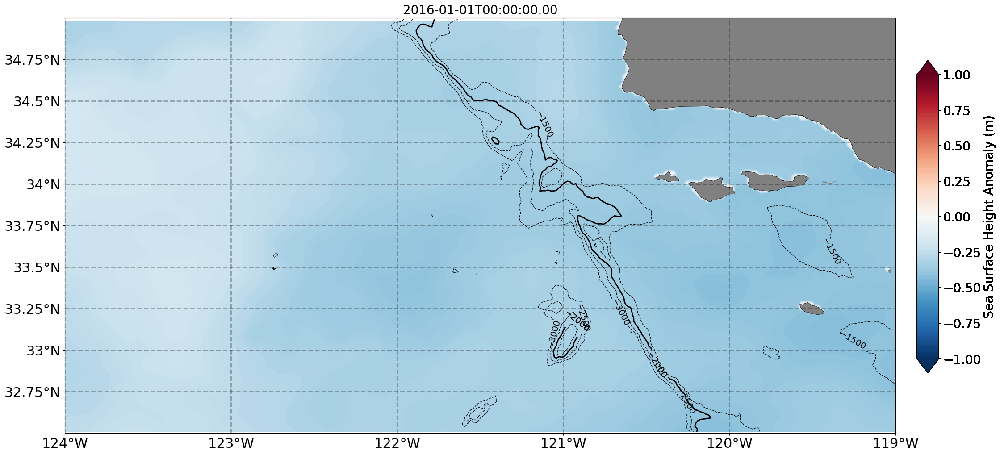

In [23]:
# Set plotting parameters
projection = ccrs.PlateCarree(central_longitude=0.0)
xticks = [-124, -123, -122, -121, -120, -119]
yticks = [32.75, 33.00, 33.25, 33.50, 33.75, 34.00, 34.25, 34.50, 34.75,]
resolution = "10m"
cmap = plt.get_cmap('RdBu_r')
bounds = np.arange(0,360+40,40)
lon_min = -124
lon_max = -119
lat_min = 32.50
lat_max = 35
levels = np.arange(-1,1+0.01,0.01)
num_frames = len(ds_subset['time'])

# Create figure
fig, ax = plt.subplots(1,1, figsize=(24, 20), subplot_kw={"projection": projection})

# Set figure axes 
cart.set_subplots(ax, projection, resolution, lon_min=-124, lon_max=-119, lat_min=32.50, lat_max=35)

# ---------------------
# Animation update function
# ---------------------
def update(frame, ds_subset, time, cmap, projection, resolution, levels, xticks, yticks, fig):

    # Clear the axis to reset the plot
    ax.clear()

    # Redraw map features
    cart.set_subplots(ax, projection, resolution, lon_min=-124, lon_max=-119, lat_min=32.50, lat_max=35)

    # Add a dynamic title 
    ax.set_title(str(time[frame])[:-7],fontsize=20) # ax.set_title(f"Time Step: {time_step * frame} hours") 

    # Plot potential temperature
    mesh = ax.contourf(
        lon, lat, ds_subset['ETAN'][frame,:,:], levels=levels,
        transform=ccrs.PlateCarree(),
        cmap=cmap,  
        shading="auto",
        extend='both'
    )

    # Plot depth contour lines
    levels_bath = np.arange(-3000,-1000,500)
    contour1 = ax.contour(lon_grid, lat_grid, bathy_grid,levels=levels_bath, colors='black', linewidths=1, linestyles='dashed')
    contour2 = ax.contour(lon_grid, lat_grid, bathy_grid,levels=[-2000], colors='black', linewidths=2, linestyles='solid')
    plt.clabel(contour1, fontsize=14)
    plt.clabel(contour2, fontsize=14)

    # Set grid ticks 
    cart.set_grid_ticks(
        ax,
        projection=ccrs.PlateCarree(),
        xticks=xticks,
        yticks=yticks,
        xlabels=True,
        ylabels=True,
        grid=True,
        fontsize=22,
        color="black",
    )

    # Create colormap
    cax = plt.axes([0.92, 0.33, 0.02, 0.35])
    cart.set_cbar(
        mesh,
        cax,
        fig,
        orientation="vertical",
        extend="both",
        cbar_label=r"Sea Surface Height Anomaly (m)",
        nbins=10,
        fontsize=20,
        cbar_ticks=[],
        task="regular",
    )

    return []

# ---------------------
# Create animation
# ---------------------
ani = FuncAnimation(fig, update, frames=num_frames, fargs=(ds_subset, time, cmap, projection, resolution, levels, xticks, yticks,fig), blit=False)

# ---------------------
# Save animation
# ---------------------
writer = FFMpegWriter(fps=10, metadata={'artist': 'SSHA time evolution map'})
ani.save(PATH_figs + 'ssha_evolution_st_time_' + str(time[0])[0:4] + '_' + str(time[0])[5:7] + '_' + str(time[0])[8:10] + '.mp4', writer=writer)

Print dataset to explore attributes of the model output

In [24]:
ds

<xarray.Dataset> Size: 1GB
Dimensions:  (XC: 672, YC: 576, XG: 672, YG: 576, Z: 90, Zp1: 91, Zu: 90,
              Zl: 90, time: 360)
Coordinates: (12/33)
  * XC       (XC) float32 3kB 230.0 230.0 230.1 230.1 ... 243.9 243.9 244.0
  * YC       (YC) float32 2kB 31.01 31.03 31.05 31.07 ... 42.93 42.95 42.97
  * XG       (XG) float32 3kB 230.0 230.0 230.0 230.1 ... 243.9 243.9 244.0
  * YG       (YG) float32 2kB 31.0 31.02 31.04 31.06 ... 42.9 42.92 42.94 42.96
  * Z        (Z) float32 360B -0.5 -1.57 -2.79 ... -6.301e+03 -6.76e+03
  * Zp1      (Zp1) float32 364B 0.0 -1.0 -2.14 ... -6.082e+03 -6.52e+03 -7e+03
    ...       ...
    maskInC  (YC, XC) bool 387kB dask.array<chunksize=(576, 672), meta=np.ndarray>
    maskInS  (YG, XC) bool 387kB dask.array<chunksize=(576, 672), meta=np.ndarray>
    maskInW  (YC, XG) bool 387kB dask.array<chunksize=(576, 672), meta=np.ndarray>
    rhoRef   (Z) float32 360B dask.array<chunksize=(90,), meta=np.ndarray>
    iter     (time) int64 3kB dask.array<chunksize=(1,), meta=np.ndarray>
  * time     (time) datetime64[ns] 3kB 2015-12-27T03:00:00 ... 2016-01-11T02:...
Data variables:
    ETAN     (time, YC, XC) float32 557MB dask.array<chunksize=(1, 576, 672), meta=np.ndarray>
Attributes:
    Conventions:  CF-1.6
    title:        netCDF wrapper of MITgcm MDS binary data
    source:       MITgcm
    history:      Created by calling `open_mdsdataset(data_dir='/data/SO2/SWO...